# Standard Analysis Notebook
CellPLATO


In [1]:
import cellPLATO as cp

import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import plotly.express as px

Finished running cellPLATO initialization and loaded config.
Initializing:  consistency_test_btrack_v2
Hypthesis testing using:  st.ttest_ind
Plots will be exported to:  Z://Collaboration_data/Mace_Lab/my_generated/cellPLATO(dev)/consistency_test_btrack_v2\2022-07-19_11-10-40-238321\plots/
Using unique embedding per dataset shortname:  consistency_test_btrack_v2
Exporting static Superplots
Exporting static Plots of Differences
Exporting static Marginal scatterplots
Exporting static Timeplots
Exporting Bar plots
Using corresponding CTL_SHORTLABEL:  WT Day 0  for condition:  Condition_Day0_Stablized WTEL08_B5
Dataset in current notebook:  consistency_test_btrack_v2
Finished initializing data_processing
Finished intializing visualizations


Finished initializing cellPLATO


In [2]:
OVERWRITE_DATAFRAMES = False

In [3]:
if os.path.exists(cp.SAVED_DATA_PATH + 'dr_df.csv'):
    print(cp.SAVED_DATA_PATH + 'dr_df_.csv',' exists, loading dataframes...')
    
    # Load existing (preprocessed) data
    comb_df = pd.read_csv(cp.SAVED_DATA_PATH + 'comb_df.csv')
    dr_df = pd.read_csv(cp.SAVED_DATA_PATH + 'dr_df.csv')
    lab_dr_df = pd.read_csv(cp.SAVED_DATA_PATH + 'lab_dr_df.csv')
    tavg_df = pd.read_csv(cp.SAVED_DATA_PATH + 'tavg_df.csv')
else:
    
    print('File doesnt exist.')

Z://Collaboration_data/Mace_Lab/my_generated/cellPLATO(dev)/consistency_test_btrack_v2\saved_data/dr_df_.csv  exists, loading dataframes...


# Load the data from h5 files in folder structure

In [5]:
# Get the experiment list from the experiments listed in the config 
exp_list = cp.populate_experiment_list()
display(exp_list)

,Condition,Experiment,Replicate_ID,Condition_shortlabel,Replicate_shortlabel
0,Condition_Day0_Stablized WTEL08_B5,Day0_Stablized WTEL08_B5_1_mask_avg_tracks,Day0_Stablized WTEL08_B5_1_mask_avg_tracks,WT Day 0,WT Day 0_0
1,Condition_Day0_Stablized WTEL08_B5,Day0_Stablized WTEL08_B5_2_mask_avg_tracks,Day0_Stablized WTEL08_B5_2_mask_avg_tracks,WT Day 0,WT Day 0_1
2,Condition_Day0_Stablized WTEL08_B5,Day0_Stablized WTEL08_B5_3_mask_avg_tracks,Day0_Stablized WTEL08_B5_3_mask_avg_tracks,WT Day 0,WT Day 0_2
3,Condition_Day7_Stablized WTEL08_B5,Day7_Stablized WTEL08_B5_1_mask_avg_tracks,Day7_Stablized WTEL08_B5_1_mask_avg_tracks,WT Day 7,WT Day 7_0
4,Condition_Day7_Stablized WTEL08_B5,Day7_Stablized WTEL08_B5_2_mask_avg_tracks,Day7_Stablized WTEL08_B5_2_mask_avg_tracks,WT Day 7,WT Day 7_1
5,Condition_Day7_Stablized WTEL08_B5,Day7_Stablized WTEL08_B5_3_mask_avg_tracks,Day7_Stablized WTEL08_B5_3_mask_avg_tracks,WT Day 7,WT Day 7_2


##### Optionally, override the experiment list in the config and select a subset.

In [6]:
# Local overide to CONDITION_SHORTLABELS in Notebook.
# conditions_to_include = ['WT_20x', 'KO_20x','WT_100x', 'KO_100x']
# conditions_to_include = ['WT_20x', 'KO_20x']
# conditions_to_include = ['WT_100x', 'KO_100x']

# conditions_to_include = ['WT Day 0', 'WT Day 7']
# # conditions_to_include = ['WT Day 0']
# # conditions_to_include = ['WT Day 7']

# # Filter exp_list using CONDITION_SHORTLABELS
# exp_list = exp_list[exp_list['Condition_shortlabel'].isin(conditions_to_include)]
# display(exp_list)

In [7]:
# Before running dr_pipeline, check if the file already exists in the local namespace
if 'comb_df' in locals():
    
    print('Using loaded comb_df')
    
else: 

    # Load, process and combine the dataframes (including segmentation and migration calculations)
    comb_df = cp.combine_dataframes(exp_list)
    comb_df = cp.measurement_pipeline(comb_df)

Using loaded comb_df


In [8]:
dr_df = cp.dr_pipeline(comb_df, dr_factors=cp.DR_FACTORS) 

Running dr_pipeline...
tSNE perplexity =  185
UMAP nearest neighbors =  10  min distance =  0.5
Using standardized factors for dimensionality reduction, matrix shape:  (9334, 28)
Using openTSNE with perplexity =  185
Using openTSNE to calculate new embedding for input data.
Embedding shape:  (9334, 2)


## Filtering data (upstream of dimensionality reduction)

Applying filters:
{'area': (0, 10000), 'ntpts': (0, 1000)}
Beginning filtering ...
9334  data points from  1006  cells
Applying filters to entire cell trajectory:
{'area': (0, 10000), 'ntpts': (0, 1000)}
...
 Finished filtering. Resulting dataframe contains:
9334  data points from  1006  cells


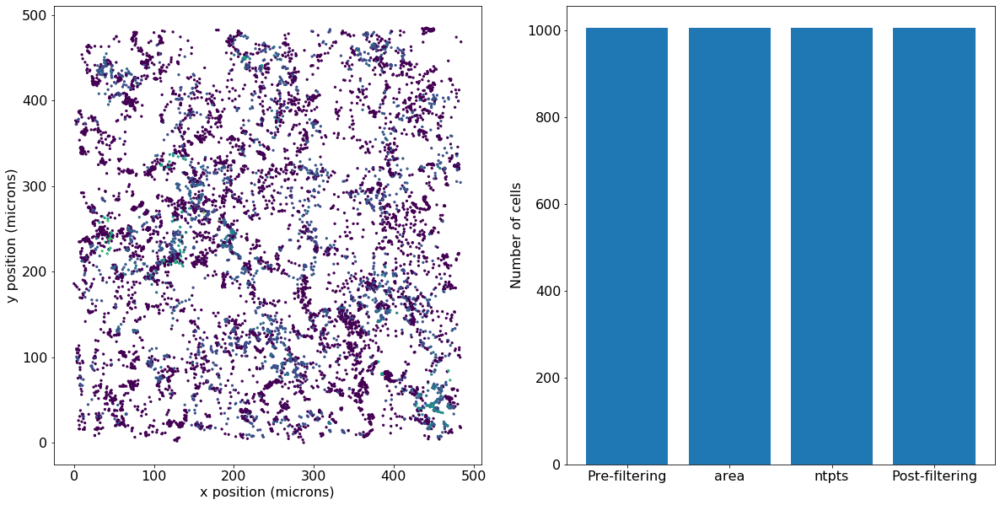

In [9]:
# User-defined filters in dict {factor:(min, max)}
data_filters = {
#   "speed": (10, 100),
  "area": (0, 10000), # Warning: range will change if self-normalized
  "ntpts": (0,1000)
}

# Returns a filtered dataframe, while also adding included column to comb_df
filt_df, filt_counts = cp.apply_filters(comb_df,filter_dict=data_filters)

fig = cp.visualize_filtering(comb_df, filt_counts)

# Time-averaged dataframe and summaries

In [10]:
''' To go into preprocessed conditional'''

if 'tavg_df' in locals():
    
    print('Using loaded tavg_df')
    
else: 
    # Process a time-averaged DataFrame
    tavg_df = cp.time_average(filt_df)
    
display(tavg_df)

Using loaded tavg_df


,Unnamed: 0,Cond_label,Condition,Condition_shortlabel,MSD,Rep_label,Replicate_ID,Replicate_shortlabel,_,area,...,turn_angle,uniq_id,unique_id,x,x_pix,x_um,y,y_pix,y_um,z
0,0,Condition_Day0_Stablized WTEL08_B5,Condition_Day0_Stablized WTEL08_B5,WT Day 0,3.256475,0.0,Day0_Stablized WTEL08_B5_1_mask_avg_tracks,WT Day 0_0,0.000000,57.542723,...,8.229688,0.000000e+00,0.0,109.467841,109.467841,133.550766,16.987667,16.987667,20.724954,0.000000
1,1,Condition_Day0_Stablized WTEL08_B5,Condition_Day0_Stablized WTEL08_B5,WT Day 0,1.625551,0.0,Day0_Stablized WTEL08_B5_1_mask_avg_tracks,WT Day 0_0,0.080000,51.122056,...,9.462928,1.212121e+47,1.0,79.446074,79.446074,96.924210,262.574783,262.574783,320.341235,0.012509
2,2,Condition_Day0_Stablized WTEL08_B5,Condition_Day0_Stablized WTEL08_B5,WT Day 0,4.987127,0.0,Day0_Stablized WTEL08_B5_1_mask_avg_tracks,WT Day 0_0,0.142857,34.254118,...,-24.072921,2.886003e+25,2.0,384.439678,384.439678,469.016407,43.127664,43.127664,52.615750,0.054901
3,3,Condition_Day0_Stablized WTEL08_B5,Condition_Day0_Stablized WTEL08_B5,WT Day 0,18.561833,0.0,Day0_Stablized WTEL08_B5_1_mask_avg_tracks,WT Day 0_0,0.178571,24.737941,...,4.463808,2.525253e+53,3.0,36.933208,36.933208,45.058514,195.650752,195.650752,238.693918,0.211684
4,4,Condition_Day0_Stablized WTEL08_B5,Condition_Day0_Stablized WTEL08_B5,WT Day 0,16.585796,0.0,Day0_Stablized WTEL08_B5_1_mask_avg_tracks,WT Day 0_0,0.000000,19.705215,...,-19.751802,2.693600e+04,4.0,20.733061,20.733061,25.294335,182.176778,182.176778,222.255669,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1001,1001,Condition_Day7_Stablized WTEL08_B5,Condition_Day7_Stablized WTEL08_B5,WT Day 7,23.827557,5.0,Day7_Stablized WTEL08_B5_3_mask_avg_tracks,WT Day 7_2,0.000000,19.320723,...,16.925341,5.141800e+04,1001.0,183.507462,183.507462,223.879103,259.044769,259.044769,316.034619,0.000000
1002,1002,Condition_Day7_Stablized WTEL08_B5,Condition_Day7_Stablized WTEL08_B5,WT Day 7,65.130268,5.0,Day7_Stablized WTEL08_B5_3_mask_avg_tracks,WT Day 7_2,0.000000,39.218184,...,-21.471490,5.142400e+04,1002.0,285.191162,285.191162,347.933218,305.066162,305.066162,372.180718,0.000000
1003,1003,Condition_Day7_Stablized WTEL08_B5,Condition_Day7_Stablized WTEL08_B5,WT Day 7,1.514795,5.0,Day7_Stablized WTEL08_B5_3_mask_avg_tracks,WT Day 7_2,0.000000,29.125269,...,22.498604,5.142500e+04,1003.0,181.603958,181.603958,221.556829,24.831684,24.831684,30.294655,0.000000
1004,1004,Condition_Day7_Stablized WTEL08_B5,Condition_Day7_Stablized WTEL08_B5,WT Day 7,3.545508,5.0,Day7_Stablized WTEL08_B5_3_mask_avg_tracks,WT Day 7_2,0.000000,23.069520,...,10.548470,5.143400e+04,1004.0,81.025002,81.025002,98.850502,183.725006,183.725006,224.144507,0.000000


In [11]:
# Average, n per condition
factor = 'area'
cp.stats_table(tavg_df, factor)

Returning stats_table using test:  st.ttest_ind  for factor:  area
Note: for exploratory purposes only, no multiple comparison correction is being applied.


,Condition_Day0_Stablized WTEL08_B5,Condition_Day7_Stablized WTEL08_B5
Condition_Day0_Stablized WTEL08_B5,NaN,0.415602
Condition_Day7_Stablized WTEL08_B5,0.415602,NaN


In [12]:
# Time-averaged plots of differences
ctl_label = cp.CONDITIONS_TO_INCLUDE[0]

cp.plots_of_differences_plotly(tavg_df, factor=factor, ctl_label=ctl_label)#, ='CTL_LABEL')

WT Day 7 vs WT Day 0: P = 0.416
P =  0.41560159209837255  (Using t-test without multiple comparison correction)
------


In [13]:
# Time-averaged superplots
cp.superplots_plotly(tavg_df, factor, t='timeaverage')

In [14]:

# Make summary calculations from time-averaged dataframe
#Per condition:
avg_df = cp.average_per_condition(tavg_df)

# Per replicate
repavg_df = cp.average_per_condition(tavg_df, avg_per_rep=True)


In [15]:
# Make summary calculations from time-averaged dataframe
#Per condition:
avg_df,std,n = cp.average_per_condition(tavg_df, avg_per_rep=False)

# display(avg_df)
# display(std)
# display(n)

In [16]:
cond_stats = cp.average_per_condition(tavg_df, avg_per_rep=False)
cp.comparative_bar(cond_stats, x='Condition', y=factor, to_plot='avg',title='_per_condition_')

In [17]:
# Average, n per replicate
rep_stats = cp.average_per_condition(tavg_df, avg_per_rep=True)
cp.comparative_bar(rep_stats, x='Replicate_ID', y=factor, to_plot='avg', title='_per_replicate_')

# Dimensionality Reduction

In [18]:
# comb_df = filt_df

In [19]:
# Before running dr_pipeline, check if the file already exists in the local namespace
if 'dr_df' in locals():
    
    print('Using loaded dr_df')
    
else: 

    dr_df = cp.dr_pipeline(comb_df, dr_factors=cp.DR_FACTORS) 

Using loaded dr_df


In [20]:
pca_df, components, expl = cp.do_pca(comb_df[cp.DR_FACTORS])

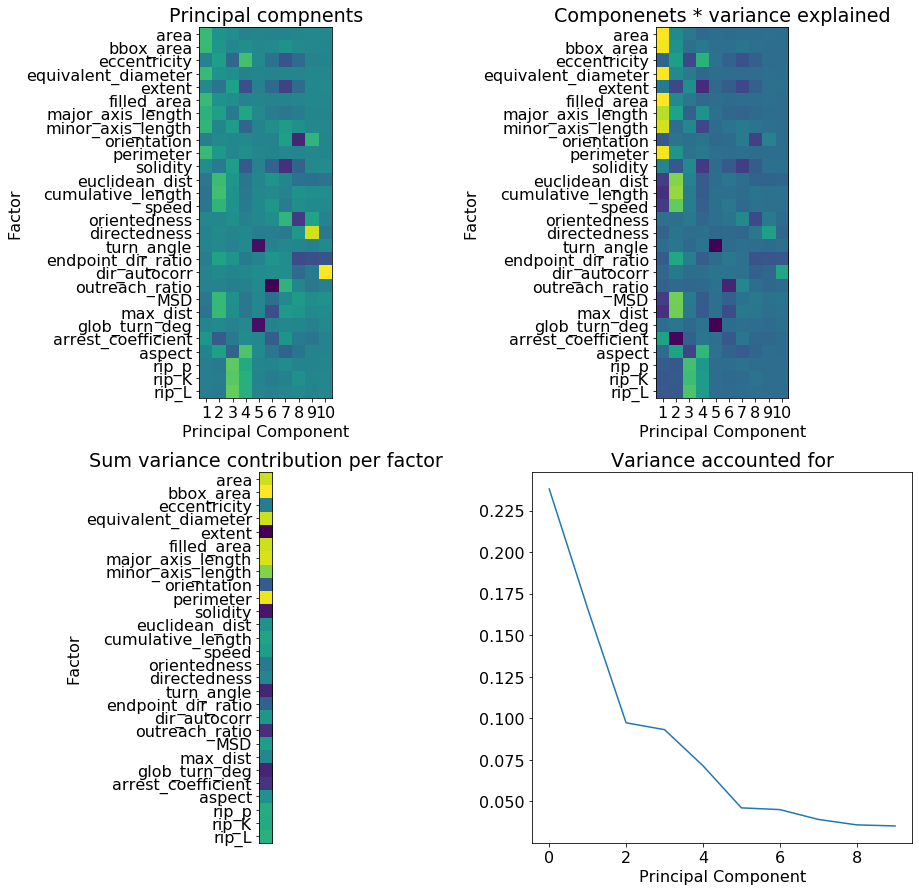

In [21]:
f = cp.pca_factor_vis(dr_df,pca_tuple=[pca_df, components, expl])#cp.DR_FACTORS)

['WT Day 0' 'WT Day 7']


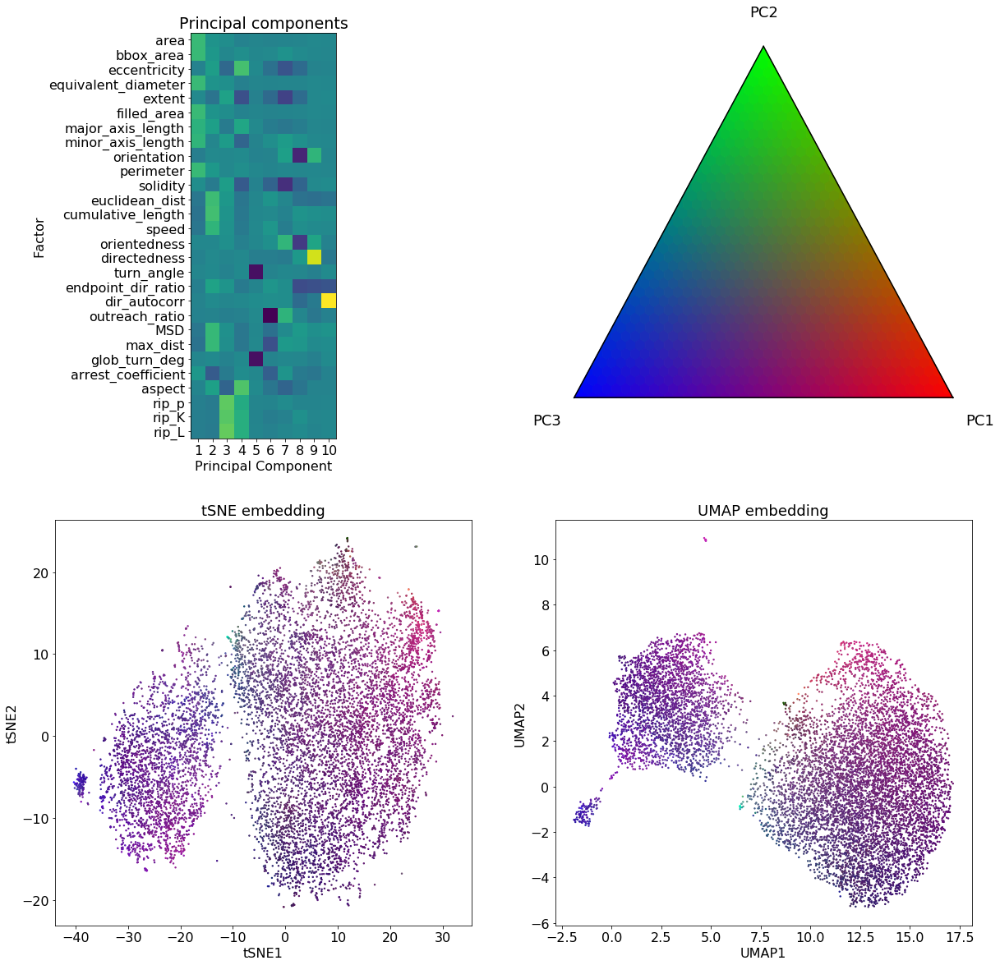

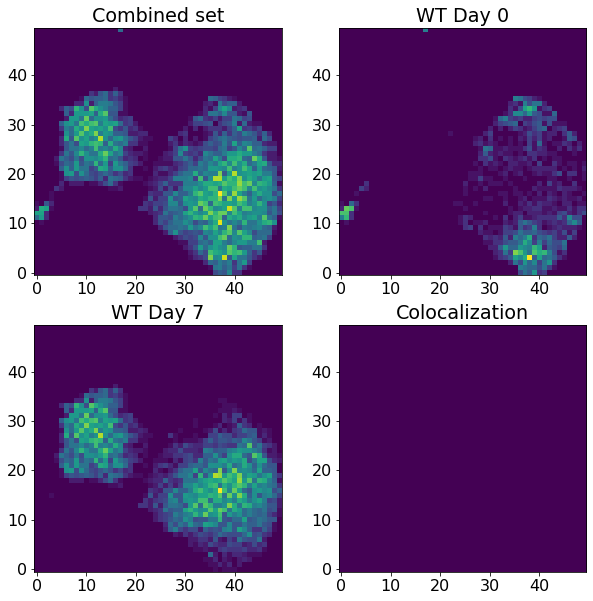

In [22]:
f=cp.dimension_reduction_subplots(dr_df,pca_tuple=[pca_df, components, expl])
f=cp.spatial_img_coloc(dr_df, xy='umap',thresh=10,n_bins=50)

##### Dissect the lowd embedding by conditions

In [23]:
# sub_df_1 = lab_dr_df[lab_dr_df['Condition_shortlabel'].str.contains('20x')]
# sub_df_2 = lab_dr_df[lab_dr_df['Condition_shortlabel'].str.contains('100x')]

# xy = 'UMAP'
# f1=vis.spatial_img_coloc(sub_df_1, xy=xy,thresh=20,n_bins=100)
# f2=vis.spatial_img_coloc(sub_df_2, xy=xy,thresh=20,n_bins=100)

In [24]:
# sub_df_1 = lab_dr_df[lab_dr_df['Condition_shortlabel'].str.contains('WT')]
# sub_df_2 = lab_dr_df[lab_dr_df['Condition_shortlabel'].str.contains('KO')]

# xy = 'UMAP'
# f1=vis.spatial_img_coloc(sub_df_1, xy=xy,thresh=20,n_bins=100)
# f2=vis.spatial_img_coloc(sub_df_2, xy=xy,thresh=20,n_bins=100)

  6%|█████▏                                                                            | 1/16 [00:00<00:01,  8.19it/s]

loading:  Z://Collaboration_data/Mace_Lab/h5/20211019T170641Z\Condition_Day0_Stablized WTEL08_B5\Day0_Stablized WTEL08_B5_1_mask_avg_tracks
2D track with zero as z component. Forcing STC
h5 file contains dummies
btrack_unpack() found h5 file containing regionprops: 
<HDF5 group "/objects/obj_type_1/properties" (12 members)>
False
loading:  Z://Collaboration_data/Mace_Lab/h5/20211019T170641Z\Condition_Day0_Stablized WTEL08_B5\Day0_Stablized WTEL08_B5_2_mask_avg_tracks
2D track with zero as z component. Forcing STC
h5 file contains dummies
btrack_unpack() found h5 file containing regionprops: 
<HDF5 group "/objects/obj_type_1/properties" (12 members)>
False


 44%|███████████████████████████████████▉                                              | 7/16 [00:00<00:00, 19.29it/s]

coords.shape:  (1717, 5)
seg.shape:  (98, 400, 400)
loading:  Z://Collaboration_data/Mace_Lab/h5/20211019T170641Z\Condition_Day0_Stablized WTEL08_B5\Day0_Stablized WTEL08_B5_3_mask_avg_tracks
2D track with zero as z component. Forcing STC
h5 file contains dummies
btrack_unpack() found h5 file containing regionprops: 
<HDF5 group "/objects/obj_type_1/properties" (12 members)>
False
coords.shape:  (1621, 5)
seg.shape:  (98, 400, 400)
loading:  Z://Collaboration_data/Mace_Lab/h5/20211019T170641Z\Condition_Day7_Stablized WTEL08_B5\Day7_Stablized WTEL08_B5_1_mask_avg_tracks
2D track with zero as z component. Forcing STC
h5 file contains dummies
btrack_unpack() found h5 file containing regionprops: 
<HDF5 group "/objects/obj_type_1/properties" (12 members)>
False


 81%|█████████████████████████████████████████████████████████████████▊               | 13/16 [00:00<00:00, 24.08it/s]

coords.shape:  (5324, 5)
seg.shape:  (60, 400, 400)
loading:  Z://Collaboration_data/Mace_Lab/h5/20211019T170641Z\Condition_Day7_Stablized WTEL08_B5\Day7_Stablized WTEL08_B5_2_mask_avg_tracks
2D track with zero as z component. Forcing STC
h5 file contains dummies
btrack_unpack() found h5 file containing regionprops: 
<HDF5 group "/objects/obj_type_1/properties" (12 members)>
False
coords.shape:  (6553, 5)
seg.shape:  (60, 400, 400)
loading:  Z://Collaboration_data/Mace_Lab/h5/20211019T170641Z\Condition_Day7_Stablized WTEL08_B5\Day7_Stablized WTEL08_B5_3_mask_avg_tracks
2D track with zero as z component. Forcing STC
h5 file contains dummies
btrack_unpack() found h5 file containing regionprops: 
<HDF5 group "/objects/obj_type_1/properties" (12 members)>
False


100%|█████████████████████████████████████████████████████████████████████████████████| 16/16 [00:00<00:00, 22.00it/s]


coords.shape:  (8210, 5)
seg.shape:  (60, 400, 400)


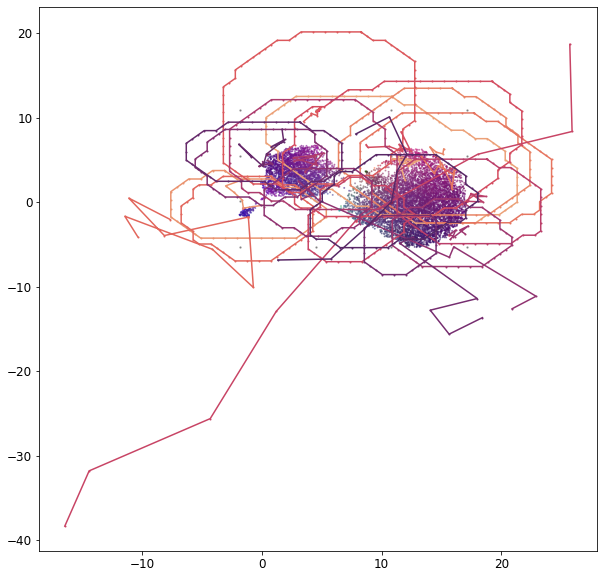

In [5]:
cp.dr_contour_matrix(dr_df,n_grid_pts=4, dr_method='umap',t_window=8) # dr_method='umap'

  3%|██▎                                                                               | 1/36 [00:00<00:04,  8.10it/s]

loading:  Z://Collaboration_data/Mace_Lab/h5/20211019T170641Z\Condition_Day0_Stablized WTEL08_B5\Day0_Stablized WTEL08_B5_1_mask_avg_tracks
2D track with zero as z component. Forcing STC
h5 file contains dummies
btrack_unpack() found h5 file containing regionprops: 
<HDF5 group "/objects/obj_type_1/properties" (12 members)>
False
loading:  Z://Collaboration_data/Mace_Lab/h5/20211019T170641Z\Condition_Day0_Stablized WTEL08_B5\Day0_Stablized WTEL08_B5_2_mask_avg_tracks
2D track with zero as z component. Forcing STC
h5 file contains dummies
btrack_unpack() found h5 file containing regionprops: 
<HDF5 group "/objects/obj_type_1/properties" (12 members)>
False


 14%|███████████▍                                                                      | 5/36 [00:00<00:02, 15.09it/s]

coords.shape:  (1717, 5)
seg.shape:  (98, 400, 400)
loading:  Z://Collaboration_data/Mace_Lab/h5/20211019T170641Z\Condition_Day7_Stablized WTEL08_B5\Day7_Stablized WTEL08_B5_1_mask_avg_tracks
2D track with zero as z component. Forcing STC
h5 file contains dummies
btrack_unpack() found h5 file containing regionprops: 
<HDF5 group "/objects/obj_type_1/properties" (12 members)>
False
coords.shape:  (5324, 5)
seg.shape:  (60, 400, 400)
loading:  Z://Collaboration_data/Mace_Lab/h5/20211019T170641Z\Condition_Day7_Stablized WTEL08_B5\Day7_Stablized WTEL08_B5_2_mask_avg_tracks


 39%|███████████████████████████████▌                                                 | 14/36 [00:00<00:00, 35.15it/s]

2D track with zero as z component. Forcing STC
h5 file contains dummies
btrack_unpack() found h5 file containing regionprops: 
<HDF5 group "/objects/obj_type_1/properties" (12 members)>
False
coords.shape:  (6553, 5)
seg.shape:  (60, 400, 400)
loading:  

100%|█████████████████████████████████████████████████████████████████████████████████| 36/36 [00:00<00:00, 47.96it/s]

Z://Collaboration_data/Mace_Lab/h5/20211019T170641Z\Condition_Day7_Stablized WTEL08_B5\Day7_Stablized WTEL08_B5_3_mask_avg_tracks
2D track with zero as z component. Forcing STC
h5 file contains dummies
btrack_unpack() found h5 file containing regionprops: 
<HDF5 group "/objects/obj_type_1/properties" (12 members)>
False
coords.shape:  (8210, 5)
seg.shape:  (60, 400, 400)


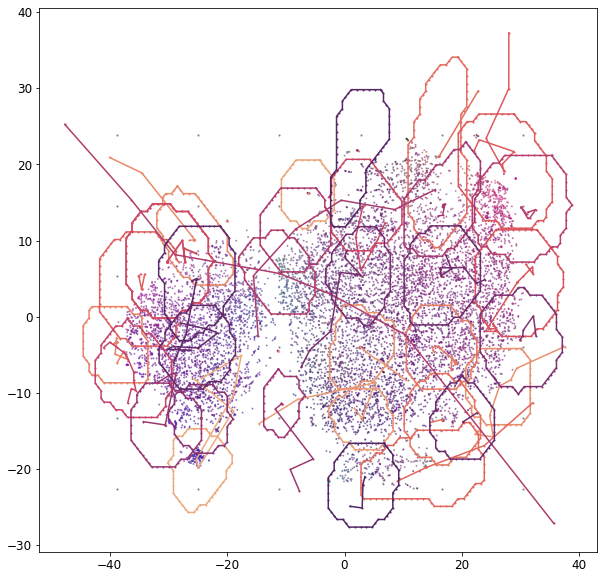

In [6]:
cp.dr_contour_matrix(dr_df,n_grid_pts=6, dr_method='tSNE',t_window=8) # dr_method='umap'

### Cluster the cell behaviour

hdbscan_clustering() with min_cluster_size =  20
DBScan clustering by UMAP...


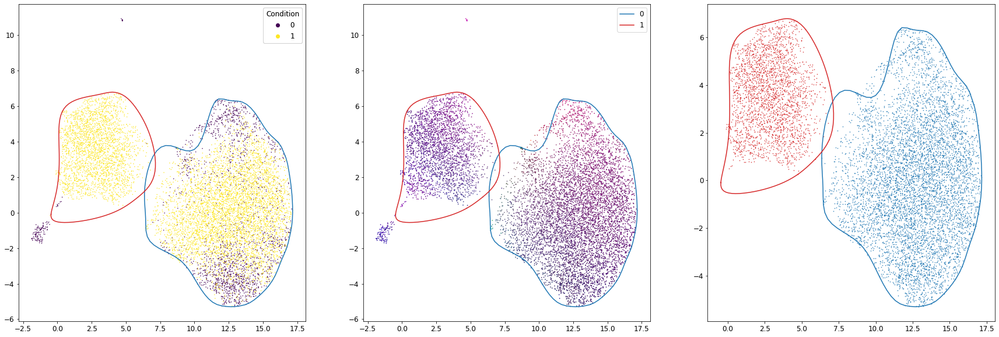

In [7]:

dr_method = cp.CLUSTER_BY

lab_dr_df = cp.hdbscan_clustering(dr_df, cluster_by=dr_method, plot=False)

fig, (ax1, ax2, ax3) = plt.subplots(nrows=1, ncols=3, figsize=[30,10])
cp.draw_cluster_hulls(lab_dr_df,cluster_by=dr_method, color_by='condition',ax=ax1,draw_pts=True,save_path=cp.CLUST_PARAMS_DIR+'condition')
cp.draw_cluster_hulls(lab_dr_df,cluster_by=dr_method, color_by='PCs',ax=ax2,legend=True,draw_pts=True,save_path=cp.CLUST_PARAMS_DIR+'pca')
cp.draw_cluster_hulls(lab_dr_df,cluster_by=dr_method, color_by='cluster',ax=ax3,draw_pts=True,save_path=cp.CLUST_PARAMS_DIR+'cluster')


##### Save files to shared folder for reopening in other notebooks and reusing with future analysis

In [8]:
# # Save dr_df to shared data folder
# dr_df.to_csv(SAVED_DATA_PATH + 'dr_df.csv')

# # Save comb_df to shared data folder
# lab_dr_df.to_csv(SAVED_DATA_PATH + 'lab_dr_df.csv')

In [9]:
'''
Note another issue of cyclic dependencies here.
'''

'\nNote another issue of cyclic dependencies here.\n'

Defining trajectories using: ( UMAP1 UMAP2 )
Completed distance matrix, shape:  (292, 292)
Determined maximum number of clusters where eps =   2.0


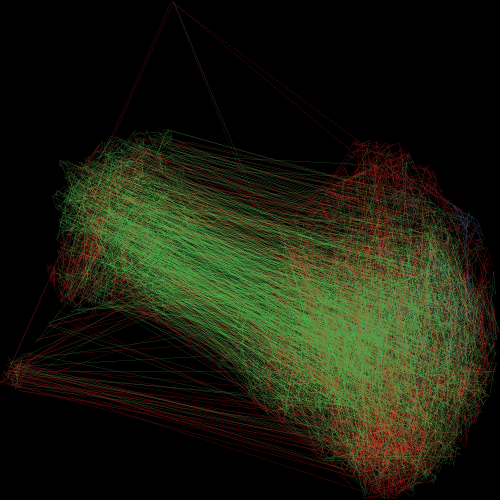

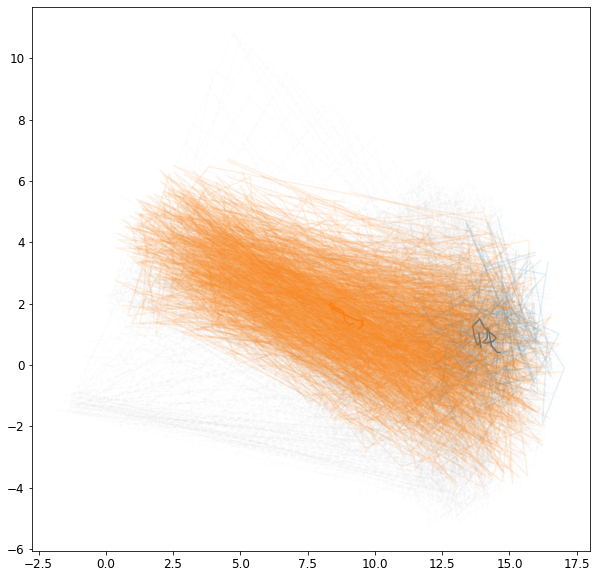

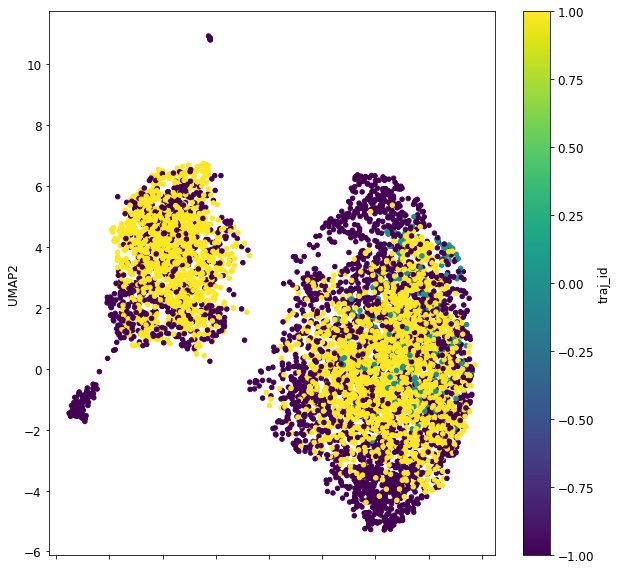

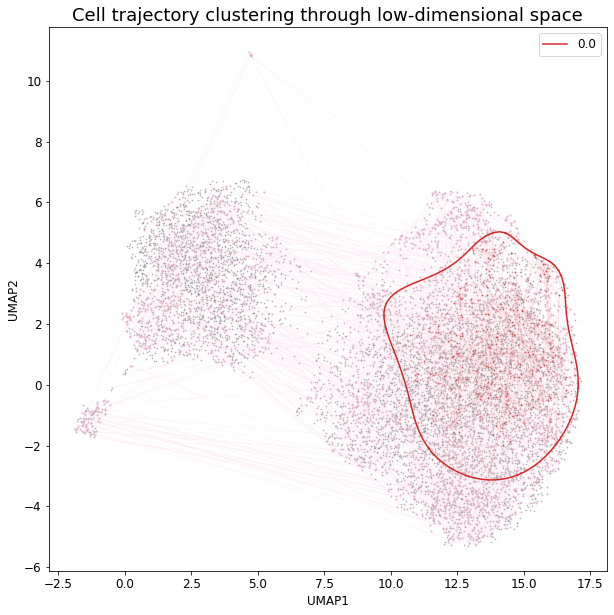

In [10]:
# Run the trajectory clustering pipeline
lab_dr_df, traj_list, cluster_lst = cp.trajectory_clustering_pipeline(lab_dr_df, traj_factor='umap', dist_metric='hausdorff', filename_out='std_dr_df_traj')

cp.plot_traj_cluster_avg(traj_list, cluster_lst, label='')
cp.trajectory_cluster_vis(lab_dr_df,traj_factor='umap', scatter=True)
cp.datashader_lines(lab_dr_df, 'UMAP1', 'UMAP2',color_by='traj_id', categorical=True, identifier='traj_id')

# Overwrite saved lab_dr_df
# lab_dr_df.to_csv(SAVED_DATA_PATH + 'lab_dr_df.csv')


### Cluster switching analysis

In [11]:
# Count the cluster changes
sum_labels, tptlabel_dr_df = cp.count_cluster_changes(lab_dr_df)
display(sum_labels)

cp.time_superplot(tptlabel_dr_df, 'n_changes',t_window=None)

,Condition,Replicate,Cell_ID,n_changes,n_labels
0,Condition_Day0_Stablized WTEL08_B5,Day0_Stablized WTEL08_B5_1_mask_avg_tracks,0_0,0,1
1,Condition_Day0_Stablized WTEL08_B5,Day0_Stablized WTEL08_B5_1_mask_avg_tracks,0_3,0,1
2,Condition_Day0_Stablized WTEL08_B5,Day0_Stablized WTEL08_B5_1_mask_avg_tracks,0_4,0,1
3,Condition_Day0_Stablized WTEL08_B5,Day0_Stablized WTEL08_B5_1_mask_avg_tracks,0_7,2,2
4,Condition_Day0_Stablized WTEL08_B5,Day0_Stablized WTEL08_B5_1_mask_avg_tracks,0_8,0,1
...,...,...,...,...,...
1001,Condition_Day7_Stablized WTEL08_B5,Day7_Stablized WTEL08_B5_3_mask_avg_tracks,5_1418,0,1
1002,Condition_Day7_Stablized WTEL08_B5,Day7_Stablized WTEL08_B5_3_mask_avg_tracks,5_1424,0,1
1003,Condition_Day7_Stablized WTEL08_B5,Day7_Stablized WTEL08_B5_3_mask_avg_tracks,5_1425,0,1
1004,Condition_Day7_Stablized WTEL08_B5,Day7_Stablized WTEL08_B5_3_mask_avg_tracks,5_1434,0,1


### Cluster Purity

In [12]:
clust_sum_df = cp.cluster_purity(lab_dr_df) 
display(clust_sum_df)
trajclust_sum_df = cp.cluster_purity(lab_dr_df, cluster_label='traj_id')
display(trajclust_sum_df)

,cluster_id,WT Day 0_ntpts,WT Day 0_ntpts_%,WT Day 0_ncells,WT Day 0_ncells_%,WT Day 7_ntpts,WT Day 7_ntpts_%,WT Day 7_ncells,WT Day 7_ncells_%
0,0.0,1774.0,26.351753,197.0,22.060470,4958.0,73.648247,696.0,77.939530
1,1.0,6.0,0.241838,4.0,0.938967,2475.0,99.758162,422.0,99.061033
2,2.0,105.0,99.056604,22.0,95.652174,1.0,0.943396,1.0,4.347826


,cluster_id,WT Day 0_ntpts,WT Day 0_ntpts_%,WT Day 0_ncells,WT Day 0_ncells_%,WT Day 7_ntpts,WT Day 7_ntpts_%,WT Day 7_ncells,WT Day 7_ncells_%
0.0,0.0,85.0,32.19697,3.0,20.0,179.0,67.80303,12.0,80.0
1.0,1.0,0.0,0.00000,0.0,0.0,3077.0,100.00000,134.0,100.0


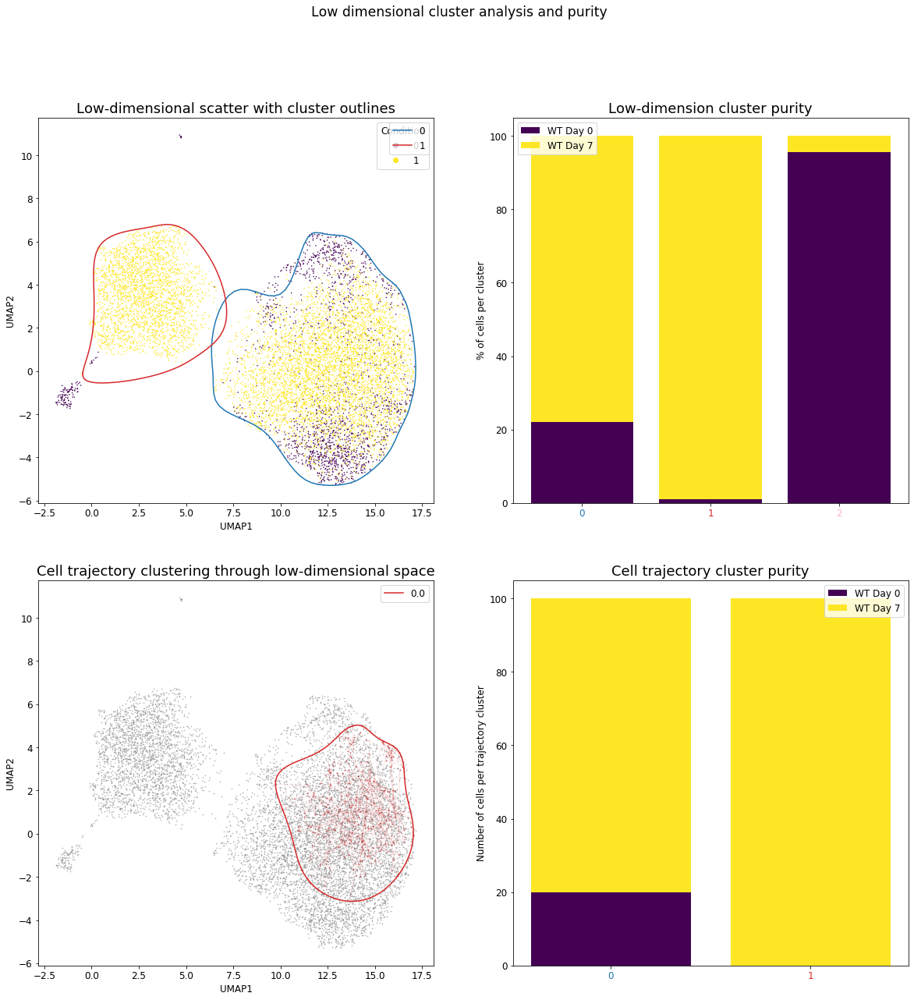

In [13]:
'''Note: accepts multiple dataframe inputs, could accept just one..'''
f = cp.purity_plots(lab_dr_df, clust_sum_df,lab_dr_df,trajclust_sum_df)

In [14]:
clust_sum_t_df = cp.cluster_composition_timecourse(lab_dr_df)
cp.cluster_timeplot(clust_sum_t_df)

In [15]:
# Count the number of cells that fall into each cluster - show on per condition and replicate basis.
lab_count_df = cp.get_label_counts(lab_dr_df, per_rep=True)

# Plot the counts per subgroup in a swarm plot
fig = px.strip(lab_count_df, x="label", y="count", color="Condition")
fig.show()

In [16]:
if OVERWRITE_DATAFRAMES:
    # Save dataframes to shared data folder
    tavg_df.to_csv(SAVED_DATA_PATH + 'tavg_df.csv')
    comb_df.to_csv(SAVED_DATA_PATH + 'comb_df.csv')
    dr_df.to_csv(SAVED_DATA_PATH + 'dr_df.csv')
    lab_dr_df.to_csv(SAVED_DATA_PATH + 'lab_dr_df.csv')